<a href="https://colab.research.google.com/github/rauledop1/my-portfolio/blob/main/automatic_mask_generator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Automatically generating object masks with SAM

[![image](https://studiolab.sagemaker.aws/studiolab.svg)](https://studiolab.sagemaker.aws/import/github/opengeos/segment-geospatial/blob/main/docs/examples/automatic_mask_generator.ipynb)
[![image](https://img.shields.io/badge/Open-Planetary%20Computer-black?style=flat&logo=microsoft)](https://pccompute.westeurope.cloudapp.azure.com/compute/hub/user-redirect/git-pull?repo=https://github.com/opengeos/segment-geospatial&urlpath=lab/tree/segment-geospatial/docs/examples/automatic_mask_generator.ipynb&branch=main)
[![image](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/opengeos/segment-geospatial/blob/main/docs/examples/automatic_mask_generator.ipynb)

This notebook shows how to segment objects from an image using the Segment Anything Model (SAM) with a few lines of code.

Make sure you use GPU runtime for this notebook. For Google Colab, go to `Runtime` -> `Change runtime type` and select `GPU` as the hardware accelerator.

The notebook is adapted from [segment-anything/notebooks/automatic_mask_generator_example.ipynb](https://github.com/opengeos/segment-anything/blob/pypi/notebooks/automatic_mask_generator_example.ipynb), but I have made it much easier to save the segmentation results and visualize them.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Install dependencies

Uncomment and run the following cell to install the required dependencies.

In [ ]:
#%pip install segment-geospatial

In [ ]:
import os
import leafmap
from samgeo import SamGeo, show_image, download_file, overlay_images, tms_to_geotiff
from osgeo import gdal


## Create an interactive map

In [ ]:
m = leafmap.Map(center=[-37.57662, -73.62994], zoom=17, height="800px")
m.add_basemap("SATELLITE")
m

Map(center=[-37.57662, -73.62994], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title',…


Pan and zoom the map to select the area of interest. Use the draw tools to draw a polygon or rectangle on the map

In [ ]:
# if m.user_roi_bounds() is not None:
#     bbox = m.user_roi_bounds()
# else:
#     bbox = [-122.2659, 37.8682, -122.2521, 37.8741]
# image = "satellite.tif"
# tms_to_geotiff(output=image, bbox=bbox, zoom=17, source="Satellite", overwrite=True)

## Download a sample image

You can also use your own image. Uncomment and run the following cell to use your own image.

In [ ]:
image = '/content/drive/MyDrive/Colab Notebooks/data/20240112_Primer Proyecto__c6d55cc6-c2b9-4011-baa2-e4e3aadef716.tif'

In [ ]:

def get_geotiff_resolution(geotiff_path):
    # Open the GeoTIFF file
    dataset = gdal.Open(geotiff_path)

    if dataset is None:
        print("Error: Unable to open the GeoTIFF file.")
        return

    # Get raster dimensions
    width = dataset.RasterXSize
    height = dataset.RasterYSize

    # Get raster geotransform
    geotransform = dataset.GetGeoTransform()

    # Calculate resolution
    pixel_width = geotransform[1]
    pixel_height = -geotransform[5]  # negative because Y-axis is typically top to bottom

    # Print resolution
    print("Pixel Width:", pixel_width)
    print("Pixel Height:", pixel_height)
    print("Resolution (Width x Height):", pixel_width, "x", pixel_height)
    print("Raster Dimensions (Width x Height):", width, "x", height)

    # Close the dataset
    dataset = None


get_geotiff_resolution(output_file)



Pixel Width: 1.0
Pixel Height: 1.0
Resolution (Width x Height): 1.0 x 1.0
Raster Dimensions (Width x Height): 973 x 825


In [ ]:
def resample_geotiff(input_file, output_file, target_resolution):
    # Open the input GeoTIFF file
    input_dataset = gdal.Open(input_file)

    if input_dataset is None:
        print("Error: Unable to open the input GeoTIFF file.")
        return

    # Set target resolution
    target_resolution_str = f"-tr {target_resolution} {target_resolution}"

    # Resample using gdal.Warp()
    gdal.Warp(output_file, input_dataset, options=target_resolution_str)

    # Close input dataset
    input_dataset = None

    print("Resampling complete.")

# Example usage:
output_file = '/content/sample_data/20240112_Primer_2.tif'
target_resolution = 1  # in meters per pixel

resample_geotiff(image, output_file, target_resolution)


Resampling complete.


Display the downloaded image on the map.

In [ ]:
m.layers[-1].visible = False
m.add_raster(output_file, layer_name="Image")
m

Map(bottom=20561992.0, center=[-37.57662, -73.62994], controls=(ZoomControl(options=['position', 'zoom_in_text…

## Initialize SAM class

Specify the file path to the model checkpoint. If it is not specified, the model will to downloaded to the working directory.

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=None,
)

Model checkpoint for vit_h not found.


Downloading...
From: https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
To: /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth
100%|██████████| 2.56G/2.56G [00:18<00:00, 138MB/s]


## Automatic mask generation

Segment the image and save the results to a GeoTIFF file. Set `unique=True` to assign a unique ID to each object.

In [ ]:
sam.generate(output_file, output="masks.tif", foreground=True, unique=True)

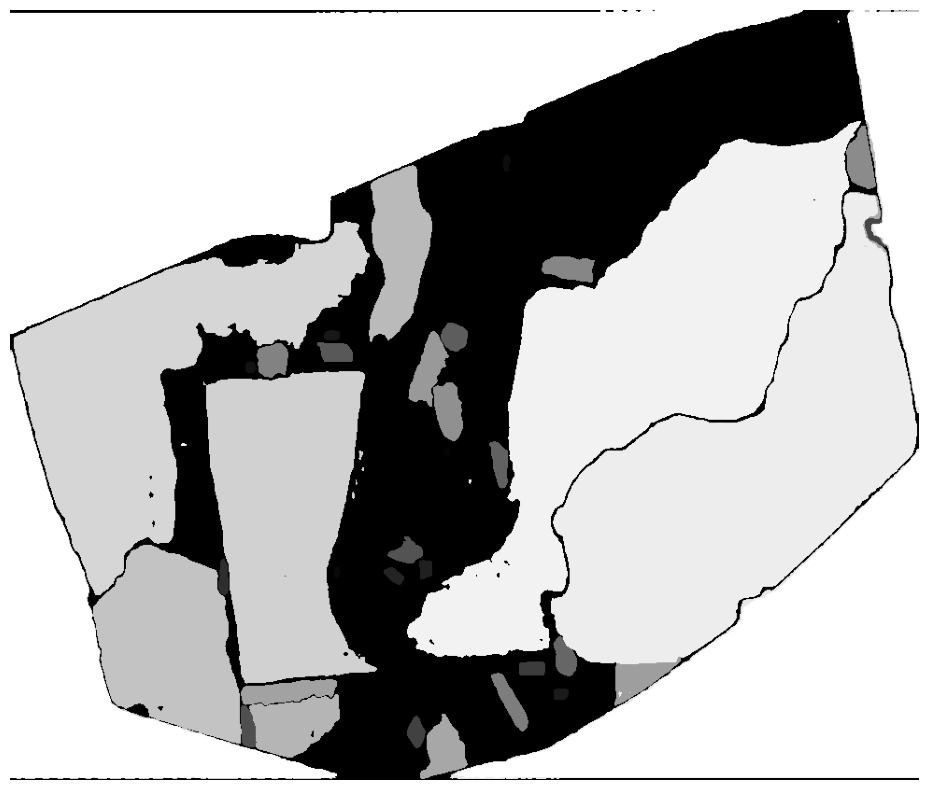

In [ ]:
sam.show_masks(cmap="binary_r")

Show the object annotations (objects with random color) on the map.

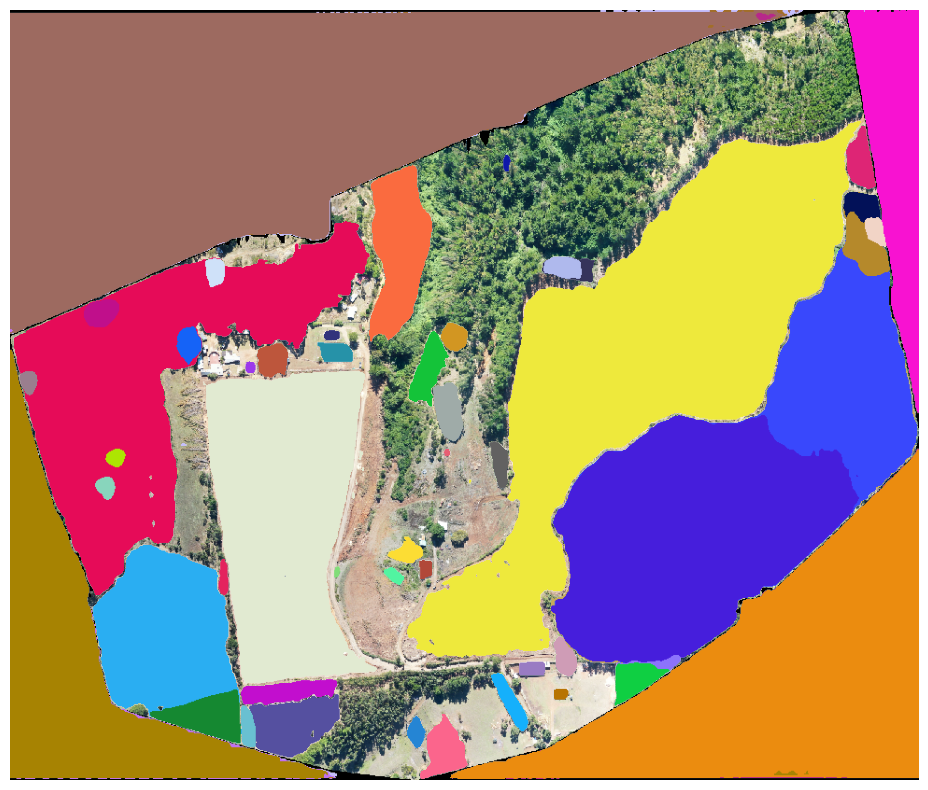

In [ ]:
sam.show_anns(axis="off", alpha=1, output="annotations.tif")

Compare images with a slider.

In [ ]:
leafmap.image_comparison(
    "/content/drive/MyDrive/Colab Notebooks/data/20240112_Primer Proyecto__c6d55cc6-c2b9-4011-baa2-e4e3aadef716.tif",
    "annotations.tif",
    label1="Satellite Image",
    label2="Image Segmentation",
)

Add image to the map.

In [ ]:
m.add_raster("annotations.tif", alpha=0.5, layer_name="Masks")
m

Map(bottom=20562282.0, center=[-37.57908941023976, -73.6261010169983], controls=(ZoomControl(options=['positio…

Convert the object annotations to vector format, such as GeoPackage, Shapefile, or GeoJSON.

In [ ]:
sam.tiff_to_vector("masks.tif", "masks.gpkg")

## Automatic mask generation options

There are several tunable parameters in automatic mask generation that control how densely points are sampled and what the thresholds are for removing low quality or duplicate masks. Additionally, generation can be automatically run on crops of the image to get improved performance on smaller objects, and post-processing can remove stray pixels and holes. Here is an example configuration that samples more masks:

In [ ]:
sam_kwargs = {
    "points_per_side": 32,
    "pred_iou_thresh": 0.86,
    "stability_score_thresh": 0.92,
    "crop_n_layers": 1,
    "crop_n_points_downscale_factor": 2,
    "min_mask_region_area": 100,
}

In [ ]:
sam = SamGeo(
    model_type="vit_h",
    sam_kwargs=sam_kwargs,
)

In [ ]:
sam.generate(output_file, output="masks2.tif", foreground=True)

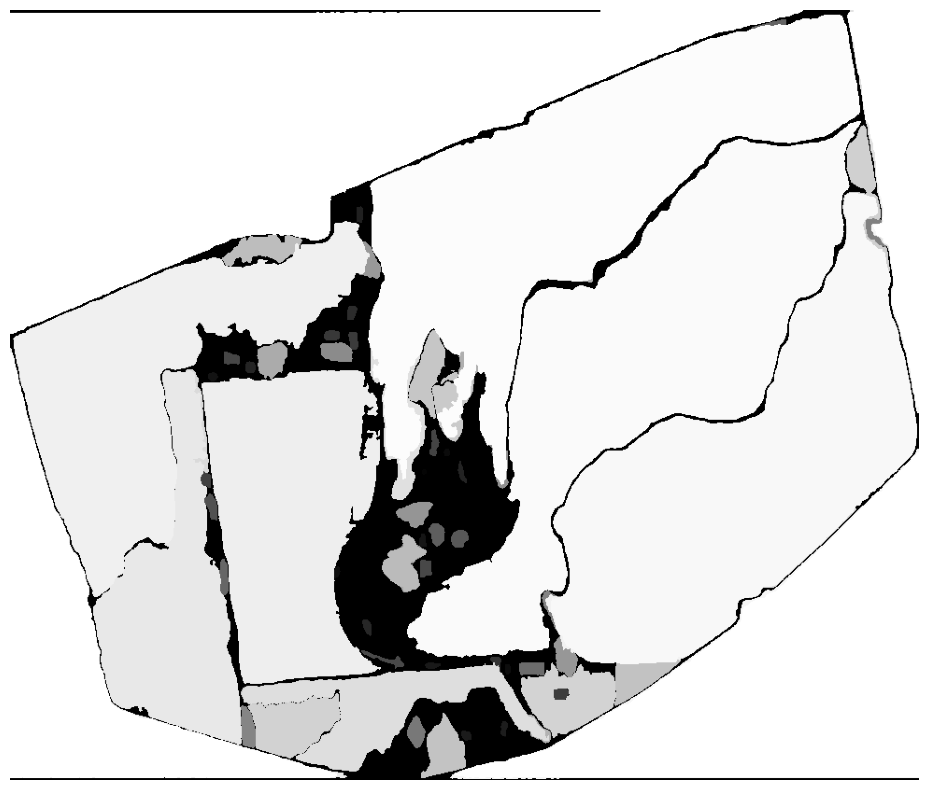

In [ ]:
sam.show_masks(cmap="binary_r")

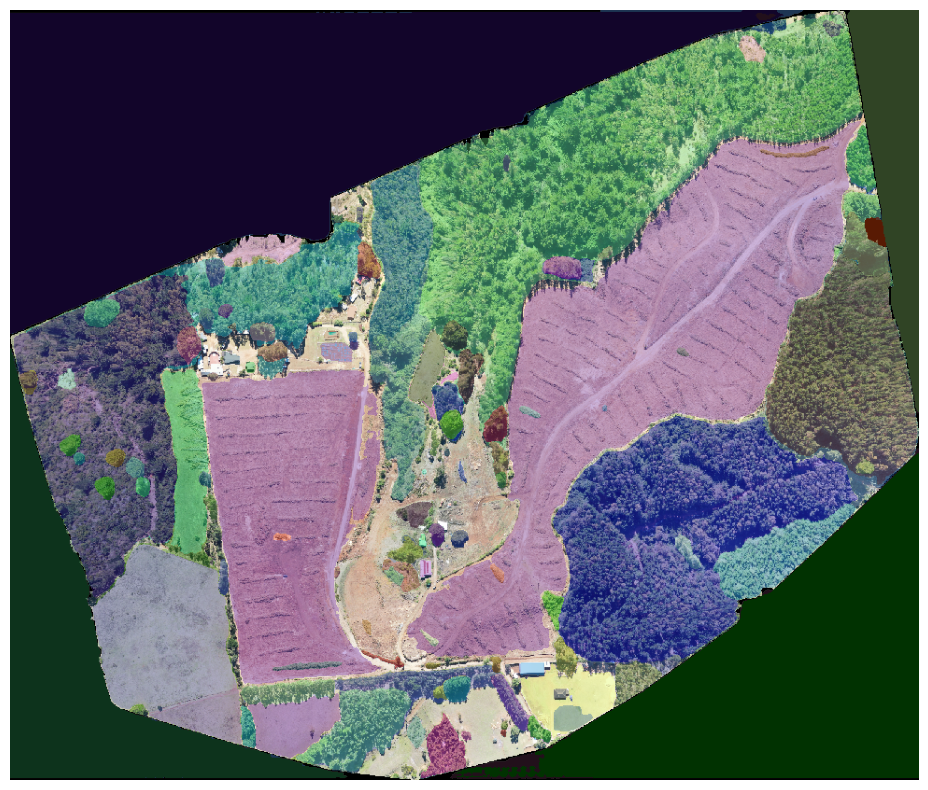

In [ ]:
sam.show_anns(axis="off", opacity=1, output="annotations2.tif")

Compare images with a slider.


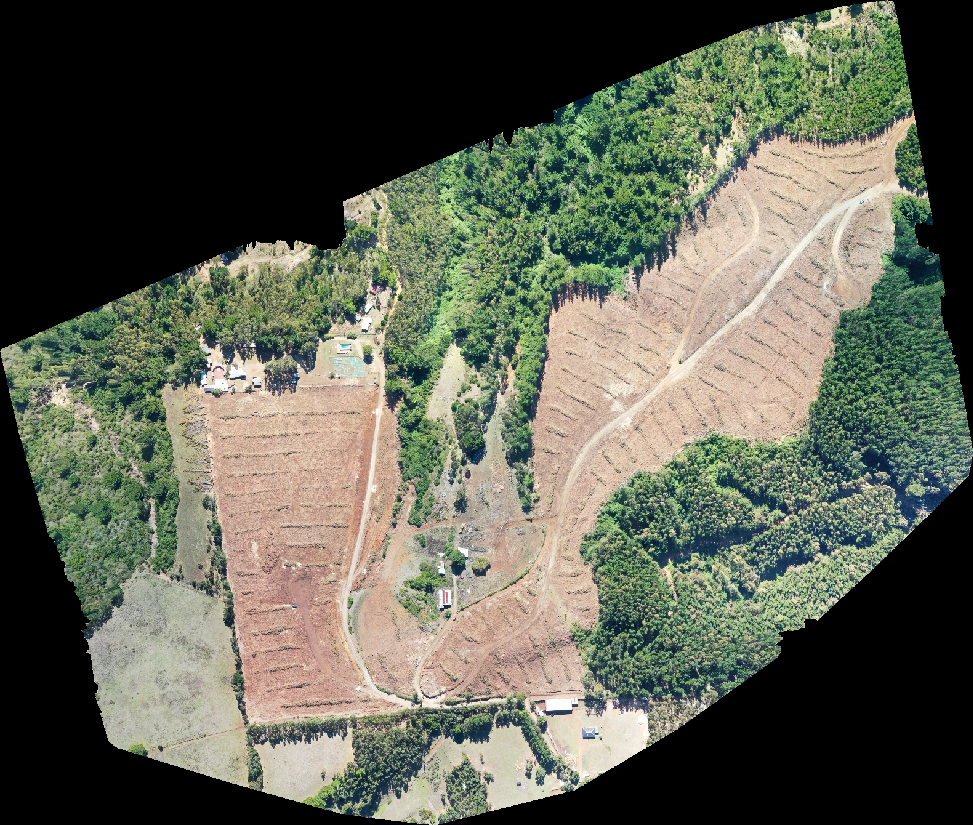
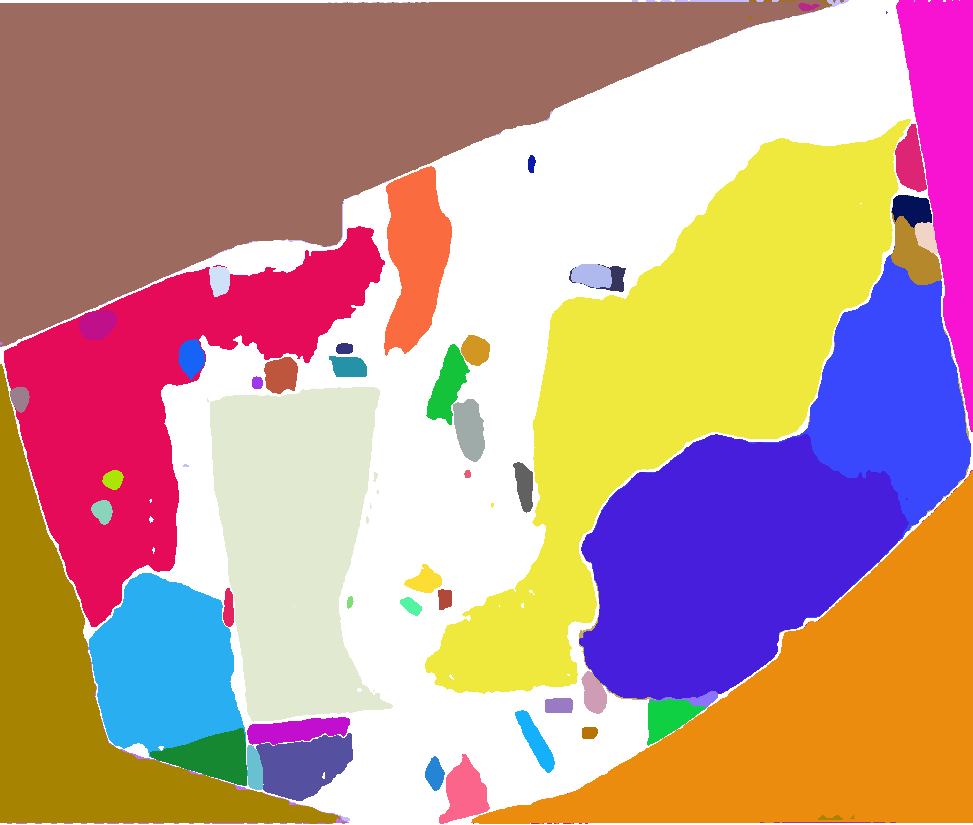

In [ ]:
leafmap.image_comparison(
    output_file,
    "annotations.tif",
    label1="Image",
    label2="Image Segmentation",
)

Overlay the annotations on the image and use the slider to change the opacity interactively.

In [ ]:
overlay_images(output_file, "annotations2.tif", backend="TkAgg")

The TkAgg backend is not supported in Google Colab. The overlay_images function will not work on Colab.


In [ ]:
sam.tiff_to_vector("masks2.tif", "masks2.gpkg")

![](https://i.imgur.com/I1IhDgz.gif)